In [1]:
#import lightgbm
import random
import pandas as pd
import numpy as np
import os
from xgboost import XGBRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import train_test_split, GridSearchCV, PredefinedSplit, KFold, TimeSeriesSplit
from sklearn.metrics import make_scorer
import matplotlib.pyplot as plt
from tqdm import tqdm
from sktime.forecasting.model_selection import temporal_train_test_split
from sktime.utils.plotting import plot_series

import warnings
warnings.filterwarnings(action='ignore')

def seed_everything(seed):
    random.seed(seed)
    os.environ['PYTHONHASHSEED'] = str(seed)
    np.random.seed(seed)

seed_everything(42) # Seed 고정

In [2]:
#데이터 불러오기
train_df = pd.read_csv('./data/train.csv')
test_df = pd.read_csv('./data/test.csv')
building_info =  pd.read_csv('./data/building_info.csv')

train_df = train_df.rename(columns={
    '건물번호': 'building_number',
    '일시': 'date_time',
    '기온(C)': 'temperature',
    '강수량(mm)': 'rainfall',
    '풍속(m/s)': 'windspeed',
    '습도(%)': 'humidity',
    '일조(hr)': 'sunshine',
    '일사(MJ/m2)': 'solar_radiation',
    '전력소비량(kWh)': 'power_consumption'
})
test_df = test_df.rename(columns={
    '건물번호': 'building_number',
    '일시': 'date_time',
    '기온(C)': 'temperature',
    '강수량(mm)': 'rainfall',
    '풍속(m/s)': 'windspeed',
    '습도(%)': 'humidity',
    '일조(hr)': 'sunshine',
    '일사(MJ/m2)': 'solar_radiation',
    '전력소비량(kWh)': 'power_consumption'
})
building_info = building_info.rename(columns={
    '건물번호': 'building_number',
    '건물유형': 'building_type',
    '연면적(m2)': 'total_area',
    '냉방면적(m2)': 'cooling_area',
    '태양광용량(kW)': 'solar_power_capacity',
    'ESS저장용량(kWh)': 'ess_capacity',
    'PCS용량(kW)': 'pcs_capacity'
})
translation_dict = {
    '건물기타': 'Other Buildings',
    '공공': 'Public',
    '대학교': 'University',
    '데이터센터': 'Data Center',
    '백화점및아울렛': 'Department Store and Outlet',
    '병원': 'Hospital',
    '상용': 'Commercial',
    '아파트': 'Apartment',
    '연구소': 'Research Institute',
    '지식산업센터': 'Knowledge Industry Center',
    '할인마트': 'Discount Mart',
    '호텔및리조트': 'Hotel and Resort'
}

building_info['building_type'] = building_info['building_type'].replace(translation_dict)


train_df.head()

,num_date_time,building_number,date_time,temperature,rainfall,windspeed,humidity,sunshine,solar_radiation,power_consumption
0,1_20220601 00,1,20220601 00,18.6,NaN,0.9,42.0,NaN,NaN,1085.28
1,1_20220601 01,1,20220601 01,18.0,NaN,1.1,45.0,NaN,NaN,1047.36
2,1_20220601 02,1,20220601 02,17.7,NaN,1.5,45.0,NaN,NaN,974.88
3,1_20220601 03,1,20220601 03,16.7,NaN,1.4,48.0,NaN,NaN,953.76
4,1_20220601 04,1,20220601 04,18.4,NaN,2.8,43.0,NaN,NaN,986.40


In [3]:
test_df.head()

,num_date_time,building_number,date_time,temperature,rainfall,windspeed,humidity
0,1_20220825 00,1,20220825 00,23.5,0.0,2.2,72
1,1_20220825 01,1,20220825 01,23.0,0.0,0.9,72
2,1_20220825 02,1,20220825 02,22.7,0.0,1.5,75
3,1_20220825 03,1,20220825 03,22.1,0.0,1.3,78
4,1_20220825 04,1,20220825 04,21.8,0.0,1.0,77


In [4]:
building_info.head()

,building_number,building_type,total_area,cooling_area,solar_power_capacity,ess_capacity,pcs_capacity
0,1,Other Buildings,110634.00,39570.00,-,-,-
1,2,Other Buildings,122233.47,99000.00,-,-,-
2,3,Other Buildings,171243.00,113950.00,40,-,-
3,4,Other Buildings,74312.98,34419.62,60,-,-
4,5,Other Buildings,205884.00,150000.00,-,2557,1000


Train 과 Test의 차이: columns에 일조, 일사, 전력 소비량이 없다.

## 전처리 (병합, 빈칸 채우기, 형 변환, num_date_time 삭제)

In [3]:

pd.set_option('display.max_columns', 30)

def merge(df):
    df = df.fillna(0)
    date = pd.to_datetime(df.date_time)
    df['hour'] = date.dt.hour
    df['day'] = date.dt.weekday
    df['month'] = date.dt.month
    df['week'] = date.dt.weekofyear
    
    # 'building_number'를 기준으로 두 데이터프레임 병합 및 전처리
    merged_df = pd.merge(df, building_info, on='building_number',how='right')
    #merge후 전처리
    merged_df['solar_power_capacity'] = merged_df['solar_power_capacity'].replace('-', 0)
    merged_df['ess_capacity'] = merged_df['ess_capacity'].replace('-', 0)
    merged_df['pcs_capacity'] = merged_df['pcs_capacity'].replace('-', 0)

    merged_df['solar_power_capacity'] = merged_df['solar_power_capacity'].astype('float64')
    merged_df['ess_capacity'] = merged_df['ess_capacity'].astype('float64')
    merged_df['pcs_capacity'] = merged_df['pcs_capacity'].astype('float64')
    return merged_df.drop(columns =['num_date_time','building_type'])


merged_train_df_m = merge(train_df)
merged_test_df_m = merge(test_df)

kk = merged_train_df_m.loc[(merged_train_df_m.building_number == 95)&(merged_train_df_m.hour == 16)&(merged_train_df_m.day == 2), 'power_consumption']
sum16 = kk.sum()/12
kkk = merged_train_df_m.loc[(merged_train_df_m.building_number == 95)&(merged_train_df_m.hour == 17)&(merged_train_df_m.day == 2), 'power_consumption']
sum17 = (kkk.sum()-0.36)/12
merged_train_df_m.loc[(merged_train_df_m.building_number == 95)&(merged_train_df_m.hour == 16)&(merged_train_df_m.day == 2)&(merged_train_df_m.month == 7)&(merged_train_df_m.week == 30)
                    , 'power_consumption'] = sum16
merged_train_df_m.loc[(merged_train_df_m.building_number == 95)&(merged_train_df_m.hour == 17)&(merged_train_df_m.day == 2)&(merged_train_df_m.month == 7)&(merged_train_df_m.week == 30)
                    , 'power_consumption'] = sum17

# #######################################
# ## 건물별, 요일별, 시간별 발전량 평균 넣어주기
# #######################################
# power_mean = pd.pivot_table(merged_train_df_m, values = 'power_consumption', index = ['building_number', 'hour', 'day'], aggfunc = np.mean).reset_index()
# tqdm.pandas()
# #######################################
# ## 건물별 시간별 발전량 평균 넣어주기
# #######################################
# power_hour_mean = pd.pivot_table(merged_train_df_m, values = 'power_consumption', index = ['building_number', 'hour'], aggfunc = np.mean).reset_index()
# tqdm.pandas()
#     #######################################
# ## 건물별 시간별 발전량 표준편차 넣어주기
# #######################################
# power_hour_std = pd.pivot_table(merged_train_df_m, values = 'power_consumption', index = ['building_number', 'hour'], aggfunc = np.std).reset_index()
# tqdm.pandas()

In [4]:
def preprocessing(df):
    # df['day_hour_mean'] = df.progress_apply(lambda x : power_mean.loc[(power_mean.building_number == x['building_number']) & (power_mean.hour == x['hour']) & (power_mean.day == x['day']) ,'power_consumption'].values[0], axis = 1)
    # df['hour_mean'] = df.progress_apply(lambda x : power_hour_mean.loc[(power_hour_mean.building_number == x['building_number']) & (power_hour_mean.hour == x['hour']) ,'power_consumption'].values[0], axis = 1)   
    # df['hour_std'] = df.progress_apply(lambda x : power_hour_std.loc[(power_hour_std.building_number == x['building_number']) & (power_hour_std.hour == x['hour']) ,'power_consumption'].values[0], axis = 1)
    
    #######################################
    ## 건물별, 요일별, 전력시간별 소비량 평균 넣어주기
    #######################################
    power_mean = pd.pivot_table(merged_train_df_m, values = 'power_consumption', index = ['building_number', 'hour', 'day'], aggfunc = np.mean).reset_index()
    #######################################
    ## 건물별, 요일별, 전력시간별 소비량 표준편차 넣어주기
    #######################################
    power_std = pd.pivot_table(merged_train_df_m, values = 'power_consumption', index = ['building_number', 'hour', 'day'], aggfunc = np.std).reset_index()
    #######################################
    ## 건물별 시간별 전력소비량 평균 넣어주기
    #######################################
    power_hour_mean = pd.pivot_table(merged_train_df_m, values = 'power_consumption', index = ['building_number', 'hour'], aggfunc = np.mean).reset_index()
    #######################################
    ## 건물별 시간별 전력소비량 표준편차 넣어주기
    #######################################
    power_hour_std = pd.pivot_table(merged_train_df_m, values = 'power_consumption', index = ['building_number', 'hour'], aggfunc = np.std).reset_index()
    
    
    # 병합을 위한 키 설정
    merge_keys = ['building_number', 'hour', 'day']  
    # 데이터프레임 병합
    df = df.merge(power_mean[merge_keys + ['power_consumption']], on=merge_keys, how='left', suffixes=('', '_day_hour_mean'))
    df = df.merge(power_std[merge_keys + ['power_consumption']], on=merge_keys, how='left', suffixes=('', '_day_hour_std'))
    df = df.merge(power_hour_mean[merge_keys[:-1] + ['power_consumption']], on=merge_keys[:-1], how='left', suffixes=('', '_hour_mean'))
    df = df.merge(power_hour_std[merge_keys[:-1] + ['power_consumption']], on=merge_keys[:-1], how='left', suffixes=('', '_hour_std'))
    df = df.rename(columns = {'power_consumption_day_hour_mean':'day_hour_mean','power_consumption_day_hour_std':'day_hour_std','power_consumption_hour_mean':'hour_mean','power_consumption_hour_std':'hour_std',})
    

    def CDH(xs):
        ys = []
        for i in range(len(xs)):
            if i < 11:
                ys.append(np.sum(xs[:(i+1)]-26))
            else:
                ys.append(np.sum(xs[(i-11):(i+1)]-26))
        return np.array(ys)

    cdhs = np.array([])
    for num in range(1,101,1):
        temp = df[df['building_number'] == num]
        cdh = CDH(temp['temperature'].values)
        cdhs = np.concatenate([cdhs, cdh])
    df['CDH'] = cdhs
    
    ### 공휴일 변수 추가
    df['holiday'] = df.apply(lambda x : 0 if x['day']<5 else 1, axis = 1)
    #df.loc[('2022-08-15'<=df.date_time)&('2022-06-01'<=df.date_time)&('2022-06-06'<=df.date_time), 'holiday'] = 1
    df['date_time'] = df['date_time'].apply(lambda x : int(x[0:8]))
    # df.loc[(df.date_time == 20220601, 'holiday')] = 1
    # df.loc[(df.date_time == 20220606, 'holiday')] = 1
    # df.loc[(df.date_time == 20220815, 'holiday')] = 1
    df.loc[(df.date_time == 20220601, 'holiday')] = 2
    df.loc[(df.date_time == 20220606, 'holiday')] = 2
    df.loc[(df.date_time == 20220815, 'holiday')] = 2

    ## https://dacon.io/competitions/official/235680/codeshare/2366?page=1&dtype=recent
    df['sin_time'] = np.sin(2*np.pi*df.hour/24)
    df['cos_time'] = np.cos(2*np.pi*df.hour/24)
    
    ## https://dacon.io/competitions/official/235736/codeshare/2743?page=1&dtype=recent
    df['THI'] = 9/5*df['temperature'] - 0.55*(1-df['humidity']/100)*(9/5*df['humidity']-26)+32

    
    return df

merged_train_df_m =preprocessing(merged_train_df_m)
merged_test_df_m =preprocessing(merged_test_df_m).rename(columns = {'power_consumption':'day_hour_mean'})


In [5]:
merged_train_df = pd.DataFrame()
merged_valid_df = pd.DataFrame()
for i in range(1,101,1):
    buff = merged_train_df_m.loc[(merged_train_df_m.building_number == i)]
    merged_train_df = pd.concat([merged_train_df, buff[:-168]])
    merged_valid_df = pd.concat([merged_valid_df, buff[-168:]])

In [5]:

def data_train(df):

    #df['cooling_to_total_area_ratio'] =  df['cooling_area'] / df['total_area']
    
    #grouped = df.groupby(['building_number', 'week', 'day'])
    grouped = df.groupby(['building_number', 'date_time'])

    df['max_power'] = grouped['power_consumption'].transform(np.max)
    df['min_power'] = grouped['power_consumption'].transform(np.min)
    
    #grouped2 = df.groupby(['building_number', 'week', 'day','holiday'])
    grouped2 = df.groupby(['building_number', 'day'])

    df['max_power'] = grouped2['max_power'].transform(np.mean)
    df['min_power'] = grouped2['min_power'].transform(np.mean)

    #df['solar_to_ess_ratio'] = df['solar_power_capacity'] / df['ess_capacity']
    #df['efficiency'] = df['pcs_capacity'] / df['power_consumption']
    
    df.replace([np.inf, -np.inf], np.nan, inplace=True)
    df.fillna(0,inplace=True)
    ## StandardScaler 객체 생성
    #from sklearn.preprocessing import MinMaxScaler
    # scaler = MinMaxScaler()
    ## 데이터 표준화
    # df['solar_to_ess_ratio'] = scaler.fit_transform(df[['solar_to_ess_ratio']])
    # df['efficiency'] = scaler.fit_transform(df[['efficiency']])
    #df.drop(columns=['sunshine','pcs_capacity','ess_capacity','solar_power_capacity','solar_radiation','total_area','cooling_area'],inplace= True)
    df.drop(columns=['cooling_area', 'sunshine','pcs_capacity','ess_capacity','solar_power_capacity','solar_radiation','total_area'],inplace= True)

    return df

def data_test(df):

    #df['cooling_to_total_area_ratio'] =  df['cooling_area'] / df['total_area']
    
    #df.drop(columns=['max_power', 'min_power'])
    grouped_train = merged_train_df.groupby(['building_number', 'day'])
    max_power = grouped_train['max_power'].median()
    min_power = grouped_train['min_power'].median()
    max_power_df = max_power.reset_index()
    min_power_df = min_power.reset_index()

    # 테스트 데이터에 max_power_median와 min_power_median을 추가
    df = pd.merge(df, max_power_df, on=['building_number', 'day'])
    df = pd.merge(df, min_power_df, on=['building_number', 'day'])

    #df['solar_to_ess_ratio'] = df['solar_power_capacity'] / df['ess_capacity']
    #df['efficiency'] = df['pcs_capacity'] / df['power_consumption']
    
    df.replace([np.inf, -np.inf], np.nan, inplace=True)
    df.fillna(0,inplace=True)
    ## StandardScaler 객체 생성
    #from sklearn.preprocessing import MinMaxScaler
    # scaler = MinMaxScaler()
    ## 데이터 표준화
    # df['solar_to_ess_ratio'] = scaler.fit_transform(df[['solar_to_ess_ratio']])
    # df['efficiency'] = scaler.fit_transform(df[['efficiency']])
    #df.drop(columns=['pcs_capacity','ess_capacity','solar_power_capacity','total_area','cooling_area'],inplace= True)
    df.drop(columns=['cooling_area','pcs_capacity','ess_capacity','solar_power_capacity','total_area'],inplace= True)

    return df


merged_train_df =data_train(merged_train_df_m)
#merged_valid_df =data_test(merged_valid_df)
merged_test_df =data_test(merged_test_df_m)
#merged_valid_df = merged_valid_df.drop(columns = 'sunshine')
#merged_valid_df = merged_valid_df.drop(columns = 'solar_radiation')


In [7]:
final_train_df = data_train(merged_train_df_m)

In [8]:
merged_train_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 204000 entries, 0 to 203999
Data columns (total 24 columns):
 #   Column                       Non-Null Count   Dtype  
---  ------                       --------------   -----  
 0   building_number              204000 non-null  int64  
 1   date_time                    204000 non-null  int64  
 2   temperature                  204000 non-null  float64
 3   rainfall                     204000 non-null  float64
 4   windspeed                    204000 non-null  float64
 5   humidity                     204000 non-null  float64
 6   power_consumption            204000 non-null  float64
 7   hour                         204000 non-null  int64  
 8   day                          204000 non-null  int64  
 9   month                        204000 non-null  int64  
 10  week                         204000 non-null  int64  
 11  cooling_area                 204000 non-null  float64
 12  day_hour_mean                204000 non-null  float64
 13 

In [6]:
## save the preprocessed data
merged_train_df.drop(columns=['date_time']).to_csv('./data/train_preprocessed_holly4_lbw.csv')
merged_test_df.drop(columns=['date_time']).to_csv('./data/test_preprocessed_holly4_lbw.csv')


In [ ]:
final_train_df.drop(columns=['date_time']).to_csv('./data/final_train_preprocessed_holly4_lbw.csv')
merged_valid_df.drop(columns=['date_time']).to_csv('./data/valid_preprocessed_holly4_lbw.csv')

## 추가 전처리

In [2]:
## save the preprocessed data
merged_train_df = pd.read_csv('./data/train_preprocessed_holly4_lbw.csv')
merged_test_df = pd.read_csv('./data/test_preprocessed_holly4_lbw.csv')


In [ ]:
final_train_df = pd.read_csv('./data/final_train_preprocessed_holly3_lbw.csv')
merged_valid_df = pd.read_csv('./data/valid_preprocessed_holly3_lbw.csv')


In [3]:
merged_train_df = merged_train_df.drop(columns = 'Unnamed: 0')
merged_test_df = merged_test_df.drop(columns = 'Unnamed: 0')


In [ ]:
final_train_df = final_train_df.drop(columns = 'Unnamed: 0')
merged_valid_df = merged_valid_df.drop(columns = 'Unnamed: 0')
# merged_train_df = merged_train_df.drop(columns = 'cooling_area')
# merged_test_df = merged_test_df.drop(columns = 'cooling_area')
# merged_train_df = merged_train_df.drop(columns = 'solar_to_ess_ratio')
# merged_test_df = merged_test_df.drop(columns = 'solar_to_ess_ratio')
# merged_train_df = merged_train_df.drop(columns = 'cooling_to_total_area_ratio')
# merged_test_df = merged_test_df.drop(columns = 'cooling_to_total_area_ratio')


In [ ]:
merged_train_df = merged_train_df.drop(columns = 'holiday')
merged_test_df = merged_test_df.drop(columns = 'holiday')

## 원핫 인코딩(안해도 됨)

In [10]:
# merged_train_df = pd.get_dummies(merged_train_df, prefix=["bt:"], columns=["building_type"])
# merged_train_df.head()
# merged_test_df = pd.get_dummies(merged_test_df, prefix=["bt:"], columns=["building_type"])
# merged_test_df.head()

## 성능 평가지표 정의 및 SMAPE 정의

In [4]:
#### alpha를 argument로 받는 함수로 실제 objective function을 wrapping하여 alpha값을 쉽게 조정할 수 있도록 작성했습니다.
# custom objective function for forcing model not to underestimate
def weighted_mse(alpha = 1):
    def weighted_mse_fixed(label, pred):
        residual = (label - pred).astype("float")
        grad = np.where(residual>0, -2*alpha*residual, -2*residual)
        hess = np.where(residual>0, 2*alpha, 2.0)
        return grad, hess
    return weighted_mse_fixed

 #점수 측정을 위한 코드
def SMAPE(y_true, y_pred):
    return 100/len(y_true) * np.sum(2 * np.abs(y_pred - y_true) / (np.abs(y_true) + np.abs(y_pred)))

In [ ]:
# for i in np.arange(0.8, 1.0, 0.1):
#     print(i)
# for i in np.arange(1, 101, 1):
#     print(i)   

## 최적의 파라미터 탐색

In [10]:

df = pd.DataFrame(columns = ['n_estimators', 'eta', 'min_child_weight','max_depth', 'colsample_bytree', 'subsample'])
preds = np.array([])

grid = {'n_estimators' : [100], 'eta' : [0.01], 'min_child_weight' : np.arange(1, 12, 1),
        'max_depth' : np.arange(3,10,1) , 'colsample_bytree' :np.arange(0.8, 1.0, 0.1),
        'subsample' :np.arange(0.8, 1.0, 0.1)} # fix the n_estimators & eta(learning rate)

#tscv = TimeSeriesSplit(n_splits=3)
smape_score = make_scorer(SMAPE, greater_is_better=False)

for i in tqdm(np.arange(1, 101, 1)):
    y = merged_train_df.loc[merged_train_df.building_number == i, 'power_consumption']
    x = merged_train_df.loc[merged_train_df.building_number == i].drop(['power_consumption'], axis=1)
    y_train, y_test, x_train, x_test = temporal_train_test_split(y = y, X = x, test_size = 168)

    pds = PredefinedSplit(np.append(-np.ones(len(x_train)-168), np.zeros(168)))
    gcv = GridSearchCV(estimator = XGBRegressor(seed=0,tree_method="hist"),
                       param_grid=grid, scoring=smape_score, cv=pds, refit=True, verbose=True)
    
    # gcv = GridSearchCV(estimator = XGBRegressor(seed = 0, gpu_id = 1, tree_method = 'gpu_hist', predictor= 'gpu_predictor'),
    #                     param_grid = grid, scoring = smape_score, cv = pds, refit = True, verbose = True)

    gcv.fit(x_train, y_train)
    best = gcv.best_estimator_
    params = gcv.best_params_
    print(params)
    pred = best.predict(x_test)
    building = 'building'+str(i)
    print(building + '|| SMAPE : {}'.format(SMAPE(y_test, pred)))
    preds = np.append(preds, pred)
    df = pd.concat([df, pd.DataFrame(params, index=[0])], axis=0)
    df.to_csv('./parameters/hyperparameter_xgb_holly4_lbw.csv', index=False) # save the tuned parameters


  0%|          | 0/100 [00:00<?, ?it/s]

Fitting 1 folds for each of 308 candidates, totalling 308 fits


  1%|          | 1/100 [00:20<33:57, 20.58s/it]

{'colsample_bytree': 0.9, 'eta': 0.01, 'max_depth': 6, 'min_child_weight': 3, 'n_estimators': 100, 'subsample': 0.9}
building1|| SMAPE : 44.82718988327255
Fitting 1 folds for each of 308 candidates, totalling 308 fits


  2%|▏         | 2/100 [00:40<33:16, 20.37s/it]

{'colsample_bytree': 0.9, 'eta': 0.01, 'max_depth': 8, 'min_child_weight': 10, 'n_estimators': 100, 'subsample': 0.9}
building2|| SMAPE : 40.847897239816554
Fitting 1 folds for each of 308 candidates, totalling 308 fits


  3%|▎         | 3/100 [01:03<34:20, 21.25s/it]

{'colsample_bytree': 0.9, 'eta': 0.01, 'max_depth': 3, 'min_child_weight': 7, 'n_estimators': 100, 'subsample': 0.9}
building3|| SMAPE : 35.824170058812214
Fitting 1 folds for each of 308 candidates, totalling 308 fits


  4%|▍         | 4/100 [01:19<30:38, 19.15s/it]

{'colsample_bytree': 0.9, 'eta': 0.01, 'max_depth': 5, 'min_child_weight': 9, 'n_estimators': 100, 'subsample': 0.9}
building4|| SMAPE : 42.45557035164121
Fitting 1 folds for each of 308 candidates, totalling 308 fits


  5%|▌         | 5/100 [01:39<31:09, 19.68s/it]

{'colsample_bytree': 0.8, 'eta': 0.01, 'max_depth': 5, 'min_child_weight': 10, 'n_estimators': 100, 'subsample': 0.9}
building5|| SMAPE : 46.939980980908054
Fitting 1 folds for each of 308 candidates, totalling 308 fits


  6%|▌         | 6/100 [01:57<29:44, 18.98s/it]

{'colsample_bytree': 0.9, 'eta': 0.01, 'max_depth': 4, 'min_child_weight': 4, 'n_estimators': 100, 'subsample': 0.9}
building6|| SMAPE : 46.892936889509016
Fitting 1 folds for each of 308 candidates, totalling 308 fits


  7%|▋         | 7/100 [02:17<30:06, 19.43s/it]

{'colsample_bytree': 0.8, 'eta': 0.01, 'max_depth': 3, 'min_child_weight': 1, 'n_estimators': 100, 'subsample': 0.9}
building7|| SMAPE : 41.30957478711682
Fitting 1 folds for each of 308 candidates, totalling 308 fits


  8%|▊         | 8/100 [02:33<27:51, 18.17s/it]

{'colsample_bytree': 0.8, 'eta': 0.01, 'max_depth': 4, 'min_child_weight': 1, 'n_estimators': 100, 'subsample': 0.9}
building8|| SMAPE : 45.072554121678266
Fitting 1 folds for each of 308 candidates, totalling 308 fits


  9%|▉         | 9/100 [02:51<27:38, 18.22s/it]

{'colsample_bytree': 0.8, 'eta': 0.01, 'max_depth': 5, 'min_child_weight': 4, 'n_estimators': 100, 'subsample': 0.9}
building9|| SMAPE : 44.896485457858134
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 10%|█         | 10/100 [03:08<26:46, 17.85s/it]

{'colsample_bytree': 0.9, 'eta': 0.01, 'max_depth': 3, 'min_child_weight': 6, 'n_estimators': 100, 'subsample': 0.9}
building10|| SMAPE : 37.81136396410239
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 11%|█         | 11/100 [03:23<25:15, 17.03s/it]

{'colsample_bytree': 0.9, 'eta': 0.01, 'max_depth': 3, 'min_child_weight': 3, 'n_estimators': 100, 'subsample': 0.9}
building11|| SMAPE : 43.13895913721383
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 12%|█▏        | 12/100 [03:41<25:08, 17.15s/it]

{'colsample_bytree': 0.9, 'eta': 0.01, 'max_depth': 6, 'min_child_weight': 1, 'n_estimators': 100, 'subsample': 0.9}
building12|| SMAPE : 45.80653181004912
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 13%|█▎        | 13/100 [03:57<24:23, 16.83s/it]

{'colsample_bytree': 0.8, 'eta': 0.01, 'max_depth': 8, 'min_child_weight': 8, 'n_estimators': 100, 'subsample': 0.9}
building13|| SMAPE : 45.57866482849978
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 14%|█▍        | 14/100 [04:16<25:16, 17.64s/it]

{'colsample_bytree': 0.8, 'eta': 0.01, 'max_depth': 3, 'min_child_weight': 4, 'n_estimators': 100, 'subsample': 0.9}
building14|| SMAPE : 39.24847481447942
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 15%|█▌        | 15/100 [04:32<24:13, 17.10s/it]

{'colsample_bytree': 0.9, 'eta': 0.01, 'max_depth': 4, 'min_child_weight': 8, 'n_estimators': 100, 'subsample': 0.9}
building15|| SMAPE : 42.18573668172601
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 16%|█▌        | 16/100 [04:50<24:16, 17.34s/it]

{'colsample_bytree': 0.9, 'eta': 0.01, 'max_depth': 8, 'min_child_weight': 1, 'n_estimators': 100, 'subsample': 0.9}
building16|| SMAPE : 42.032476637691815
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 17%|█▋        | 17/100 [05:08<24:30, 17.72s/it]

{'colsample_bytree': 0.8, 'eta': 0.01, 'max_depth': 4, 'min_child_weight': 9, 'n_estimators': 100, 'subsample': 0.9}
building17|| SMAPE : 47.844882636152164
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 18%|█▊        | 18/100 [05:26<24:19, 17.80s/it]

{'colsample_bytree': 0.9, 'eta': 0.01, 'max_depth': 4, 'min_child_weight': 7, 'n_estimators': 100, 'subsample': 0.9}
building18|| SMAPE : 48.57772086694697
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 19%|█▉        | 19/100 [05:45<24:15, 17.97s/it]

{'colsample_bytree': 0.8, 'eta': 0.01, 'max_depth': 4, 'min_child_weight': 11, 'n_estimators': 100, 'subsample': 0.8}
building19|| SMAPE : 49.746126672879996
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 20%|██        | 20/100 [06:03<23:55, 17.95s/it]

{'colsample_bytree': 0.8, 'eta': 0.01, 'max_depth': 8, 'min_child_weight': 7, 'n_estimators': 100, 'subsample': 0.8}
building20|| SMAPE : 46.9480337006386
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 21%|██        | 21/100 [06:21<23:40, 17.99s/it]

{'colsample_bytree': 0.9, 'eta': 0.01, 'max_depth': 4, 'min_child_weight': 9, 'n_estimators': 100, 'subsample': 0.9}
building21|| SMAPE : 45.1204061349971
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 22%|██▏       | 22/100 [06:37<22:33, 17.35s/it]

{'colsample_bytree': 0.9, 'eta': 0.01, 'max_depth': 3, 'min_child_weight': 11, 'n_estimators': 100, 'subsample': 0.9}
building22|| SMAPE : 45.519154222354985
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 23%|██▎       | 23/100 [06:51<21:11, 16.51s/it]

{'colsample_bytree': 0.9, 'eta': 0.01, 'max_depth': 3, 'min_child_weight': 11, 'n_estimators': 100, 'subsample': 0.9}
building23|| SMAPE : 45.49866449354721
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 24%|██▍       | 24/100 [07:08<21:10, 16.71s/it]

{'colsample_bytree': 0.9, 'eta': 0.01, 'max_depth': 4, 'min_child_weight': 5, 'n_estimators': 100, 'subsample': 0.8}
building24|| SMAPE : 44.71874432458557
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 25%|██▌       | 25/100 [07:25<21:00, 16.81s/it]

{'colsample_bytree': 0.8, 'eta': 0.01, 'max_depth': 6, 'min_child_weight': 11, 'n_estimators': 100, 'subsample': 0.9}
building25|| SMAPE : 46.90327634693172
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 26%|██▌       | 26/100 [07:42<20:45, 16.84s/it]

{'colsample_bytree': 0.9, 'eta': 0.01, 'max_depth': 3, 'min_child_weight': 8, 'n_estimators': 100, 'subsample': 0.9}
building26|| SMAPE : 44.85900576528123
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 27%|██▋       | 27/100 [07:58<20:13, 16.62s/it]

{'colsample_bytree': 0.9, 'eta': 0.01, 'max_depth': 4, 'min_child_weight': 10, 'n_estimators': 100, 'subsample': 0.9}
building27|| SMAPE : 43.26514379679526
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 28%|██▊       | 28/100 [08:16<20:11, 16.83s/it]

{'colsample_bytree': 0.9, 'eta': 0.01, 'max_depth': 6, 'min_child_weight': 5, 'n_estimators': 100, 'subsample': 0.9}
building28|| SMAPE : 39.40372153995643
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 29%|██▉       | 29/100 [08:32<19:50, 16.77s/it]

{'colsample_bytree': 0.8, 'eta': 0.01, 'max_depth': 6, 'min_child_weight': 5, 'n_estimators': 100, 'subsample': 0.9}
building29|| SMAPE : 42.7822495626615
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 30%|███       | 30/100 [08:52<20:34, 17.63s/it]

{'colsample_bytree': 0.8, 'eta': 0.01, 'max_depth': 5, 'min_child_weight': 11, 'n_estimators': 100, 'subsample': 0.9}
building30|| SMAPE : 44.09155824212753
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 31%|███       | 31/100 [09:09<20:05, 17.46s/it]

{'colsample_bytree': 0.9, 'eta': 0.01, 'max_depth': 4, 'min_child_weight': 11, 'n_estimators': 100, 'subsample': 0.9}
building31|| SMAPE : 40.527032870207925
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 32%|███▏      | 32/100 [09:20<17:41, 15.60s/it]

{'colsample_bytree': 0.9, 'eta': 0.01, 'max_depth': 3, 'min_child_weight': 1, 'n_estimators': 100, 'subsample': 0.9}
building32|| SMAPE : 44.44472880625884
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 33%|███▎      | 33/100 [09:31<15:52, 14.22s/it]

{'colsample_bytree': 0.9, 'eta': 0.01, 'max_depth': 3, 'min_child_weight': 1, 'n_estimators': 100, 'subsample': 0.9}
building33|| SMAPE : 45.056957194674006
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 34%|███▍      | 34/100 [09:43<14:45, 13.42s/it]

{'colsample_bytree': 0.8, 'eta': 0.01, 'max_depth': 3, 'min_child_weight': 1, 'n_estimators': 100, 'subsample': 0.8}
building34|| SMAPE : 44.58383411174869
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 35%|███▌      | 35/100 [09:54<13:42, 12.65s/it]

{'colsample_bytree': 0.9, 'eta': 0.01, 'max_depth': 3, 'min_child_weight': 1, 'n_estimators': 100, 'subsample': 0.9}
building35|| SMAPE : 44.98969193139706
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 36%|███▌      | 36/100 [10:04<12:41, 11.90s/it]

{'colsample_bytree': 0.9, 'eta': 0.01, 'max_depth': 3, 'min_child_weight': 1, 'n_estimators': 100, 'subsample': 0.9}
building36|| SMAPE : 44.98054080943704
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 37%|███▋      | 37/100 [10:23<14:45, 14.06s/it]

{'colsample_bytree': 0.8, 'eta': 0.01, 'max_depth': 3, 'min_child_weight': 3, 'n_estimators': 100, 'subsample': 0.9}
building37|| SMAPE : 47.22619388093815
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 38%|███▊      | 38/100 [10:43<16:25, 15.90s/it]

{'colsample_bytree': 0.9, 'eta': 0.01, 'max_depth': 8, 'min_child_weight': 2, 'n_estimators': 100, 'subsample': 0.9}
building38|| SMAPE : 44.73942132244958
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 39%|███▉      | 39/100 [11:02<17:01, 16.74s/it]

{'colsample_bytree': 0.8, 'eta': 0.01, 'max_depth': 3, 'min_child_weight': 11, 'n_estimators': 100, 'subsample': 0.8}
building39|| SMAPE : 47.937262662410696
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 40%|████      | 40/100 [11:24<18:11, 18.19s/it]

{'colsample_bytree': 0.9, 'eta': 0.01, 'max_depth': 4, 'min_child_weight': 6, 'n_estimators': 100, 'subsample': 0.9}
building40|| SMAPE : 47.74918310282943
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 41%|████      | 41/100 [11:43<18:17, 18.60s/it]

{'colsample_bytree': 0.9, 'eta': 0.01, 'max_depth': 5, 'min_child_weight': 6, 'n_estimators': 100, 'subsample': 0.9}
building41|| SMAPE : 46.3837457785874
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 42%|████▏     | 42/100 [12:02<18:06, 18.74s/it]

{'colsample_bytree': 0.9, 'eta': 0.01, 'max_depth': 7, 'min_child_weight': 5, 'n_estimators': 100, 'subsample': 0.9}
building42|| SMAPE : 47.13099110044273
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 43%|████▎     | 43/100 [12:21<17:48, 18.75s/it]

{'colsample_bytree': 0.9, 'eta': 0.01, 'max_depth': 5, 'min_child_weight': 8, 'n_estimators': 100, 'subsample': 0.9}
building43|| SMAPE : 44.52995986541657
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 44%|████▍     | 44/100 [12:39<17:24, 18.64s/it]

{'colsample_bytree': 0.9, 'eta': 0.01, 'max_depth': 6, 'min_child_weight': 6, 'n_estimators': 100, 'subsample': 0.9}
building44|| SMAPE : 42.85603490689464
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 45%|████▌     | 45/100 [12:56<16:28, 17.98s/it]

{'colsample_bytree': 0.9, 'eta': 0.01, 'max_depth': 5, 'min_child_weight': 7, 'n_estimators': 100, 'subsample': 0.9}
building45|| SMAPE : 46.83344294860938
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 46%|████▌     | 46/100 [13:13<16:04, 17.86s/it]

{'colsample_bytree': 0.9, 'eta': 0.01, 'max_depth': 5, 'min_child_weight': 10, 'n_estimators': 100, 'subsample': 0.9}
building46|| SMAPE : 44.84869921279056
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 47%|████▋     | 47/100 [13:30<15:25, 17.45s/it]

{'colsample_bytree': 0.9, 'eta': 0.01, 'max_depth': 5, 'min_child_weight': 9, 'n_estimators': 100, 'subsample': 0.9}
building47|| SMAPE : 42.0930188295499
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 48%|████▊     | 48/100 [13:47<15:03, 17.37s/it]

{'colsample_bytree': 0.9, 'eta': 0.01, 'max_depth': 5, 'min_child_weight': 3, 'n_estimators': 100, 'subsample': 0.9}
building48|| SMAPE : 45.965495213595126
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 49%|████▉     | 49/100 [14:03<14:25, 16.97s/it]

{'colsample_bytree': 0.9, 'eta': 0.01, 'max_depth': 4, 'min_child_weight': 7, 'n_estimators': 100, 'subsample': 0.9}
building49|| SMAPE : 48.06115536389838
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 50%|█████     | 50/100 [14:19<13:53, 16.67s/it]

{'colsample_bytree': 0.9, 'eta': 0.01, 'max_depth': 4, 'min_child_weight': 11, 'n_estimators': 100, 'subsample': 0.9}
building50|| SMAPE : 43.609059359336115
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 51%|█████     | 51/100 [14:36<13:43, 16.82s/it]

{'colsample_bytree': 0.9, 'eta': 0.01, 'max_depth': 6, 'min_child_weight': 11, 'n_estimators': 100, 'subsample': 0.9}
building51|| SMAPE : 46.10991282770539
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 52%|█████▏    | 52/100 [14:53<13:34, 16.97s/it]

{'colsample_bytree': 0.9, 'eta': 0.01, 'max_depth': 4, 'min_child_weight': 2, 'n_estimators': 100, 'subsample': 0.9}
building52|| SMAPE : 46.61032833247779
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 53%|█████▎    | 53/100 [15:15<14:22, 18.35s/it]

{'colsample_bytree': 0.9, 'eta': 0.01, 'max_depth': 3, 'min_child_weight': 1, 'n_estimators': 100, 'subsample': 0.9}
building53|| SMAPE : 37.919290890458676
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 54%|█████▍    | 54/100 [15:37<15:00, 19.57s/it]

{'colsample_bytree': 0.9, 'eta': 0.01, 'max_depth': 3, 'min_child_weight': 11, 'n_estimators': 100, 'subsample': 0.8}
building54|| SMAPE : 58.41792802239075
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 55%|█████▌    | 55/100 [15:50<13:08, 17.52s/it]

{'colsample_bytree': 0.8, 'eta': 0.01, 'max_depth': 3, 'min_child_weight': 1, 'n_estimators': 100, 'subsample': 0.9}
building55|| SMAPE : 45.231384817615634
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 56%|█████▌    | 56/100 [16:03<11:43, 15.98s/it]

{'colsample_bytree': 0.8, 'eta': 0.01, 'max_depth': 4, 'min_child_weight': 1, 'n_estimators': 100, 'subsample': 0.9}
building56|| SMAPE : 44.523970994895734
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 57%|█████▋    | 57/100 [16:22<12:10, 16.99s/it]

{'colsample_bytree': 0.9, 'eta': 0.01, 'max_depth': 6, 'min_child_weight': 6, 'n_estimators': 100, 'subsample': 0.9}
building57|| SMAPE : 44.87789852822356
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 58%|█████▊    | 58/100 [16:33<10:43, 15.32s/it]

{'colsample_bytree': 0.9, 'eta': 0.01, 'max_depth': 3, 'min_child_weight': 1, 'n_estimators': 100, 'subsample': 0.9}
building58|| SMAPE : 45.515664533468495
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 59%|█████▉    | 59/100 [16:54<11:27, 16.78s/it]

{'colsample_bytree': 0.8, 'eta': 0.01, 'max_depth': 5, 'min_child_weight': 1, 'n_estimators': 100, 'subsample': 0.9}
building59|| SMAPE : 43.22744993742352
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 60%|██████    | 60/100 [17:12<11:32, 17.32s/it]

{'colsample_bytree': 0.9, 'eta': 0.01, 'max_depth': 3, 'min_child_weight': 10, 'n_estimators': 100, 'subsample': 0.9}
building60|| SMAPE : 44.331175030089504
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 61%|██████    | 61/100 [17:32<11:49, 18.19s/it]

{'colsample_bytree': 0.8, 'eta': 0.01, 'max_depth': 3, 'min_child_weight': 9, 'n_estimators': 100, 'subsample': 0.8}
building61|| SMAPE : 43.11516349616433
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 62%|██████▏   | 62/100 [17:53<11:54, 18.81s/it]

{'colsample_bytree': 0.8, 'eta': 0.01, 'max_depth': 4, 'min_child_weight': 9, 'n_estimators': 100, 'subsample': 0.9}
building62|| SMAPE : 41.92472501468713
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 63%|██████▎   | 63/100 [18:14<12:01, 19.49s/it]

{'colsample_bytree': 0.8, 'eta': 0.01, 'max_depth': 8, 'min_child_weight': 3, 'n_estimators': 100, 'subsample': 0.8}
building63|| SMAPE : 42.24039022325633
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 64%|██████▍   | 64/100 [18:33<11:42, 19.50s/it]

{'colsample_bytree': 0.8, 'eta': 0.01, 'max_depth': 4, 'min_child_weight': 6, 'n_estimators': 100, 'subsample': 0.9}
building64|| SMAPE : 42.75092834794502
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 65%|██████▌   | 65/100 [18:55<11:50, 20.29s/it]

{'colsample_bytree': 0.9, 'eta': 0.01, 'max_depth': 6, 'min_child_weight': 11, 'n_estimators': 100, 'subsample': 0.8}
building65|| SMAPE : 38.49111730959239
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 66%|██████▌   | 66/100 [19:13<11:07, 19.62s/it]

{'colsample_bytree': 0.8, 'eta': 0.01, 'max_depth': 4, 'min_child_weight': 5, 'n_estimators': 100, 'subsample': 0.9}
building66|| SMAPE : 46.6355669120207
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 67%|██████▋   | 67/100 [19:33<10:45, 19.55s/it]

{'colsample_bytree': 0.8, 'eta': 0.01, 'max_depth': 7, 'min_child_weight': 8, 'n_estimators': 100, 'subsample': 0.9}
building67|| SMAPE : 36.38149326068244
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 68%|██████▊   | 68/100 [19:53<10:28, 19.64s/it]

{'colsample_bytree': 0.8, 'eta': 0.01, 'max_depth': 3, 'min_child_weight': 1, 'n_estimators': 100, 'subsample': 0.8}
building68|| SMAPE : 41.66361756910594
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 69%|██████▉   | 69/100 [20:10<09:46, 18.91s/it]

{'colsample_bytree': 0.8, 'eta': 0.01, 'max_depth': 4, 'min_child_weight': 8, 'n_estimators': 100, 'subsample': 0.9}
building69|| SMAPE : 43.8594763291354
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 70%|███████   | 70/100 [20:31<09:47, 19.57s/it]

{'colsample_bytree': 0.8, 'eta': 0.01, 'max_depth': 9, 'min_child_weight': 6, 'n_estimators': 100, 'subsample': 0.9}
building70|| SMAPE : 46.570124677043054
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 71%|███████   | 71/100 [20:50<09:23, 19.44s/it]

{'colsample_bytree': 0.9, 'eta': 0.01, 'max_depth': 6, 'min_child_weight': 7, 'n_estimators': 100, 'subsample': 0.9}
building71|| SMAPE : 45.873925219465356
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 72%|███████▏  | 72/100 [21:06<08:35, 18.41s/it]

{'colsample_bytree': 0.9, 'eta': 0.01, 'max_depth': 4, 'min_child_weight': 1, 'n_estimators': 100, 'subsample': 0.9}
building72|| SMAPE : 47.06629798312187
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 73%|███████▎  | 73/100 [21:23<08:02, 17.86s/it]

{'colsample_bytree': 0.9, 'eta': 0.01, 'max_depth': 5, 'min_child_weight': 7, 'n_estimators': 100, 'subsample': 0.9}
building73|| SMAPE : 44.07871816492846
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 74%|███████▍  | 74/100 [21:42<07:53, 18.21s/it]

{'colsample_bytree': 0.9, 'eta': 0.01, 'max_depth': 4, 'min_child_weight': 9, 'n_estimators': 100, 'subsample': 0.9}
building74|| SMAPE : 47.1250471741286
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 75%|███████▌  | 75/100 [22:01<07:44, 18.56s/it]

{'colsample_bytree': 0.9, 'eta': 0.01, 'max_depth': 8, 'min_child_weight': 10, 'n_estimators': 100, 'subsample': 0.9}
building75|| SMAPE : 44.29898476004786
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 76%|███████▌  | 76/100 [22:18<07:13, 18.07s/it]

{'colsample_bytree': 0.9, 'eta': 0.01, 'max_depth': 3, 'min_child_weight': 2, 'n_estimators': 100, 'subsample': 0.9}
building76|| SMAPE : 45.404812042001225
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 77%|███████▋  | 77/100 [22:37<06:59, 18.23s/it]

{'colsample_bytree': 0.8, 'eta': 0.01, 'max_depth': 6, 'min_child_weight': 7, 'n_estimators': 100, 'subsample': 0.9}
building77|| SMAPE : 45.231295149571864
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 78%|███████▊  | 78/100 [22:56<06:51, 18.68s/it]

{'colsample_bytree': 0.9, 'eta': 0.01, 'max_depth': 3, 'min_child_weight': 9, 'n_estimators': 100, 'subsample': 0.9}
building78|| SMAPE : 47.96113072460679
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 79%|███████▉  | 79/100 [23:15<06:33, 18.72s/it]

{'colsample_bytree': 0.9, 'eta': 0.01, 'max_depth': 3, 'min_child_weight': 6, 'n_estimators': 100, 'subsample': 0.8}
building79|| SMAPE : 46.05729491584681
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 80%|████████  | 80/100 [23:36<06:25, 19.27s/it]

{'colsample_bytree': 0.8, 'eta': 0.01, 'max_depth': 6, 'min_child_weight': 8, 'n_estimators': 100, 'subsample': 0.8}
building80|| SMAPE : 47.29510353125515
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 81%|████████  | 81/100 [23:56<06:10, 19.52s/it]

{'colsample_bytree': 0.9, 'eta': 0.01, 'max_depth': 6, 'min_child_weight': 10, 'n_estimators': 100, 'subsample': 0.9}
building81|| SMAPE : 44.78930641631193
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 82%|████████▏ | 82/100 [24:16<05:55, 19.76s/it]

{'colsample_bytree': 0.8, 'eta': 0.01, 'max_depth': 6, 'min_child_weight': 4, 'n_estimators': 100, 'subsample': 0.9}
building82|| SMAPE : 44.1308353633426
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 83%|████████▎ | 83/100 [24:37<05:40, 20.02s/it]

{'colsample_bytree': 0.8, 'eta': 0.01, 'max_depth': 5, 'min_child_weight': 11, 'n_estimators': 100, 'subsample': 0.8}
building83|| SMAPE : 46.34724527887401
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 84%|████████▍ | 84/100 [24:57<05:20, 20.02s/it]

{'colsample_bytree': 0.8, 'eta': 0.01, 'max_depth': 4, 'min_child_weight': 1, 'n_estimators': 100, 'subsample': 0.8}
building84|| SMAPE : 45.090854513001226
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 85%|████████▌ | 85/100 [25:14<04:48, 19.22s/it]

{'colsample_bytree': 0.8, 'eta': 0.01, 'max_depth': 4, 'min_child_weight': 11, 'n_estimators': 100, 'subsample': 0.9}
building85|| SMAPE : 47.16645486867585
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 86%|████████▌ | 86/100 [25:35<04:36, 19.73s/it]

{'colsample_bytree': 0.8, 'eta': 0.01, 'max_depth': 6, 'min_child_weight': 11, 'n_estimators': 100, 'subsample': 0.9}
building86|| SMAPE : 47.56381744592572
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 87%|████████▋ | 87/100 [25:58<04:30, 20.80s/it]

{'colsample_bytree': 0.9, 'eta': 0.01, 'max_depth': 4, 'min_child_weight': 5, 'n_estimators': 100, 'subsample': 0.9}
building87|| SMAPE : 46.367262803070986
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 88%|████████▊ | 88/100 [26:20<04:12, 21.04s/it]

{'colsample_bytree': 0.8, 'eta': 0.01, 'max_depth': 7, 'min_child_weight': 8, 'n_estimators': 100, 'subsample': 0.9}
building88|| SMAPE : 49.66188497460217
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 89%|████████▉ | 89/100 [26:45<04:04, 22.25s/it]

{'colsample_bytree': 0.9, 'eta': 0.01, 'max_depth': 5, 'min_child_weight': 6, 'n_estimators': 100, 'subsample': 0.9}
building89|| SMAPE : 49.258422809274094
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 90%|█████████ | 90/100 [27:11<03:54, 23.45s/it]

{'colsample_bytree': 0.9, 'eta': 0.01, 'max_depth': 5, 'min_child_weight': 11, 'n_estimators': 100, 'subsample': 0.9}
building90|| SMAPE : 50.62687303885919
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 91%|█████████ | 91/100 [27:34<03:28, 23.13s/it]

{'colsample_bytree': 0.9, 'eta': 0.01, 'max_depth': 4, 'min_child_weight': 4, 'n_estimators': 100, 'subsample': 0.9}
building91|| SMAPE : 48.276032445600414
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 92%|█████████▏| 92/100 [27:53<02:55, 22.00s/it]

{'colsample_bytree': 0.9, 'eta': 0.01, 'max_depth': 4, 'min_child_weight': 3, 'n_estimators': 100, 'subsample': 0.8}
building92|| SMAPE : 45.65150865937878
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 93%|█████████▎| 93/100 [28:12<02:26, 20.95s/it]

{'colsample_bytree': 0.8, 'eta': 0.01, 'max_depth': 5, 'min_child_weight': 11, 'n_estimators': 100, 'subsample': 0.8}
building93|| SMAPE : 43.2887321866618
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 94%|█████████▍| 94/100 [28:31<02:03, 20.52s/it]

{'colsample_bytree': 0.8, 'eta': 0.01, 'max_depth': 6, 'min_child_weight': 7, 'n_estimators': 100, 'subsample': 0.9}
building94|| SMAPE : 46.19114999398972
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 95%|█████████▌| 95/100 [28:51<01:42, 20.49s/it]

{'colsample_bytree': 0.9, 'eta': 0.01, 'max_depth': 3, 'min_child_weight': 11, 'n_estimators': 100, 'subsample': 0.9}
building95|| SMAPE : 30.287556471172156
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 96%|█████████▌| 96/100 [29:09<01:18, 19.64s/it]

{'colsample_bytree': 0.9, 'eta': 0.01, 'max_depth': 4, 'min_child_weight': 2, 'n_estimators': 100, 'subsample': 0.9}
building96|| SMAPE : 41.06031064788384
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 97%|█████████▋| 97/100 [29:28<00:58, 19.52s/it]

{'colsample_bytree': 0.8, 'eta': 0.01, 'max_depth': 6, 'min_child_weight': 1, 'n_estimators': 100, 'subsample': 0.9}
building97|| SMAPE : 48.09538735225849
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 98%|█████████▊| 98/100 [29:49<00:39, 19.88s/it]

{'colsample_bytree': 0.9, 'eta': 0.01, 'max_depth': 5, 'min_child_weight': 7, 'n_estimators': 100, 'subsample': 0.9}
building98|| SMAPE : 36.88747122073477
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 99%|█████████▉| 99/100 [30:08<00:19, 19.58s/it]

{'colsample_bytree': 0.8, 'eta': 0.01, 'max_depth': 6, 'min_child_weight': 8, 'n_estimators': 100, 'subsample': 0.9}
building99|| SMAPE : 44.21716844363033
Fitting 1 folds for each of 308 candidates, totalling 308 fits


100%|██████████| 100/100 [30:28<00:00, 18.29s/it]

{'colsample_bytree': 0.8, 'eta': 0.01, 'max_depth': 6, 'min_child_weight': 11, 'n_estimators': 100, 'subsample': 0.9}
building100|| SMAPE : 47.197788709795454


In [11]:
xgb_params = pd.read_csv('./parameters/hyperparameter_xgb_holly4_lbw.csv')

In [12]:
scores = []   # smape 값을 저장할 list
best_it = []  # best interation을 저장할 list

for i in tqdm(np.arange(1,101,1)):
    y = merged_train_df.loc[merged_train_df.building_number == i, 'power_consumption']
    x = merged_train_df.loc[merged_train_df.building_number == i].drop(['power_consumption'], axis=1)
    y_train, y_test, x_train, x_test = temporal_train_test_split(y = y, X = x, test_size = 168)

    xgb_reg = XGBRegressor(seed=0,tree_method="hist", 
                           n_estimators = 10000, eta = 0.01, min_child_weight = xgb_params.iloc[i-1, 2],
                           max_depth = xgb_params.iloc[i-1, 3], colsample_bytree = xgb_params.iloc[i-1, 4],
                           subsample = xgb_params.iloc[i-1, 5])
    xgb_reg.set_params(**{'objective':weighted_mse(100)}) # alpha = 100으로 고정

    xgb_reg.fit(x_train, y_train, eval_set=[(x_train, y_train),
                                            (x_test, y_test)], early_stopping_rounds=300, verbose=False)
    y_pred = xgb_reg.predict(x_test)
    pred = pd.Series(y_pred)

    sm = SMAPE(y_test, y_pred)
    scores.append(sm)
    best_it.append(xgb_reg.best_iteration) ## 실제 best iteration은 이 값에 +1 해주어야 함.


100%|██████████| 100/100 [02:32<00:00,  1.53s/it]


In [26]:
scores2 = []   # smape 값을 저장할 list
best_it2 = []  # best interation을 저장할 list

for i in tqdm(np.arange(1,101,1)):
    y = merged_train_df.loc[merged_train_df.building_number == i, 'power_consumption']
    x = merged_train_df.loc[merged_train_df.building_number == i].drop(['power_consumption'], axis=1)
    y_train, y_test, x_train, x_test = temporal_train_test_split(y = y, X = x, test_size = 168)

    xgb_reg = XGBRegressor(seed=0,tree_method="hist", 
                           n_estimators = 10000, eta = 0.001, min_child_weight = xgb_params.iloc[i-1, 2],
                           max_depth = xgb_params.iloc[i-1, 3], colsample_bytree = xgb_params.iloc[i-1, 4],
                           subsample = xgb_params.iloc[i-1, 5])
    xgb_reg.set_params(**{'objective':weighted_mse(100)}) # alpha = 100으로 고정

    xgb_reg.fit(x_train, y_train, eval_set=[(x_train, y_train),
                                            (x_test, y_test)], early_stopping_rounds=300, verbose=False)
    y_pred = xgb_reg.predict(x_test)
    pred = pd.Series(y_pred)

    sm = SMAPE(y_test, y_pred)
    scores2.append(sm)
    best_it2.append(xgb_reg.best_iteration) ## 실제 best iteration은 이 값에 +1 해주어야 함.

100%|██████████| 100/100 [19:00<00:00, 11.41s/it]


In [30]:
# 두 개의 DataFrame을 생성한다고 가정
b_data1 = {'score': scores, 'best_it': best_it}
b_data2 = {'score': scores2, 'best_it': best_it2}
b_df1 = pd.DataFrame(b_data1)
b_df2 = pd.DataFrame(b_data2)
b_df1['eta'] = 0.01
b_df2['eta'] = 0.001
# 두 DataFrame의 'column1'을 비교하여 더 작은 값을 선택하여 새로운 DataFrame 생성
b_df3 = b_df1.copy()  # 새로운 DataFrame으로 b_df1을 복사
for index, row in b_df1.iterrows():
    if row['score'] > b_df2.at[index, 'score']:
        b_df3.at[index, 'score'] = b_df2.at[index, 'score']
        b_df3.at[index, 'best_it'] = b_df2.at[index, 'best_it']
        b_df3.at[index, 'eta'] = b_df2.at[index, 'eta']


In [13]:
alpha_list = []
smape_list = []
for i in tqdm(np.arange(1,101,1)):
    y = merged_train_df.loc[merged_train_df.building_number == i, 'power_consumption']
    x = merged_train_df.loc[merged_train_df.building_number == i].drop(['power_consumption'], axis=1)
    y_train, y_test, x_train, x_test = temporal_train_test_split(y = y, X = x, test_size = 168)
    xgb = XGBRegressor(seed=0,tree_method="hist",
                      n_estimators = best_it[i-1], eta = 0.01, min_child_weight = xgb_params.iloc[i-1, 2],
                      max_depth = xgb_params.iloc[i-1, 3], colsample_bytree = xgb_params.iloc[i-1, 4], subsample = xgb_params.iloc[i-1, 5])

    xgb.fit(x_train, y_train)
    pred0 = xgb.predict(x_test)
    best_alpha = 0
    score0 = SMAPE(y_test,pred0)

    for j in [1, 3, 5, 7, 10, 25, 50, 75, 100]:
        xgb = XGBRegressor(seed=0,tree_method="hist",
                      n_estimators = best_it[i-1], eta = 0.01, min_child_weight = xgb_params.iloc[i-1, 2],
                      max_depth = xgb_params.iloc[i-1, 3], colsample_bytree = xgb_params.iloc[i-1, 4], subsample = xgb_params.iloc[i-1, 5])
        xgb.set_params(**{'objective' : weighted_mse(j)})

        xgb.fit(x_train, y_train)
        pred1 = xgb.predict(x_test)
        score1 = SMAPE(y_test, pred1)
        if score1 < score0:
            best_alpha = j
            score0 = score1

    alpha_list.append(best_alpha)
    smape_list.append(score0)
    print("building {} || best score : {} || alpha : {}".format(i, score0, best_alpha))


  1%|          | 1/100 [00:06<10:22,  6.29s/it]

building 1 || best score : 5.28934472481452 || alpha : 7


  2%|▏         | 2/100 [00:14<12:12,  7.47s/it]

building 2 || best score : 8.239173548671504 || alpha : 3


  3%|▎         | 3/100 [00:16<08:15,  5.11s/it]

building 3 || best score : 9.877431702342228 || alpha : 1


  4%|▍         | 4/100 [00:20<07:25,  4.64s/it]

building 4 || best score : 3.6842729624520825 || alpha : 1


  5%|▌         | 5/100 [00:26<07:52,  4.98s/it]

building 5 || best score : 4.8491498767687276 || alpha : 75


  6%|▌         | 6/100 [00:31<08:05,  5.16s/it]

building 6 || best score : 3.4609631332352557 || alpha : 100


  7%|▋         | 7/100 [00:35<07:04,  4.57s/it]

building 7 || best score : 8.110372922204647 || alpha : 0


  8%|▊         | 8/100 [00:39<06:52,  4.49s/it]

building 8 || best score : 5.110468903660904 || alpha : 50


  9%|▉         | 9/100 [00:44<07:08,  4.71s/it]

building 9 || best score : 2.742710524087357 || alpha : 3


 10%|█         | 10/100 [00:47<06:15,  4.17s/it]

building 10 || best score : 6.541061818418857 || alpha : 1


 11%|█         | 11/100 [00:52<06:14,  4.21s/it]

building 11 || best score : 2.963106904386659 || alpha : 75


 12%|█▏        | 12/100 [01:07<11:06,  7.57s/it]

building 12 || best score : 3.6234029534289345 || alpha : 75


 13%|█▎        | 13/100 [01:19<12:58,  8.95s/it]

building 13 || best score : 5.910385805069271 || alpha : 100


 14%|█▍        | 14/100 [01:21<09:59,  6.97s/it]

building 14 || best score : 15.526561515221571 || alpha : 75


 15%|█▌        | 15/100 [01:26<08:49,  6.23s/it]

building 15 || best score : 2.921941120718944 || alpha : 50


 16%|█▌        | 16/100 [01:33<08:54,  6.37s/it]

building 16 || best score : 3.9498969898539618 || alpha : 1


 17%|█▋        | 17/100 [01:38<08:21,  6.05s/it]

building 17 || best score : 5.364138781016753 || alpha : 7


 18%|█▊        | 18/100 [01:43<07:51,  5.75s/it]

building 18 || best score : 7.093696126730065 || alpha : 1


 19%|█▉        | 19/100 [01:53<09:34,  7.09s/it]

building 19 || best score : 7.644031013514152 || alpha : 3


 20%|██        | 20/100 [02:09<12:56,  9.70s/it]

building 20 || best score : 4.189429655160822 || alpha : 0


 21%|██        | 21/100 [02:13<10:41,  8.11s/it]

building 21 || best score : 6.371894499110215 || alpha : 3


 22%|██▏       | 22/100 [02:18<09:06,  7.01s/it]

building 22 || best score : 3.6305414891634316 || alpha : 3


 23%|██▎       | 23/100 [02:23<08:13,  6.41s/it]

building 23 || best score : 1.581086387502018 || alpha : 3


 24%|██▍       | 24/100 [02:29<07:59,  6.31s/it]

building 24 || best score : 2.0453249079968776 || alpha : 25


 25%|██▌       | 25/100 [02:39<09:30,  7.60s/it]

building 25 || best score : 1.9031303147435263 || alpha : 100


 26%|██▌       | 26/100 [02:44<08:07,  6.59s/it]

building 26 || best score : 2.254802641988432 || alpha : 75


 27%|██▋       | 27/100 [02:48<07:23,  6.07s/it]

building 27 || best score : 1.570943856749962 || alpha : 100


 28%|██▊       | 28/100 [02:53<06:42,  5.59s/it]

building 28 || best score : 3.5610715621185767 || alpha : 0


 29%|██▉       | 29/100 [03:00<07:03,  5.97s/it]

building 29 || best score : 3.290677112701279 || alpha : 0


 30%|███       | 30/100 [03:05<06:43,  5.77s/it]

building 30 || best score : 7.143178615560049 || alpha : 25


 31%|███       | 31/100 [03:08<05:47,  5.04s/it]

building 31 || best score : 4.258255453126824 || alpha : 0


 32%|███▏      | 32/100 [03:15<06:16,  5.54s/it]

building 32 || best score : 0.4357074648011802 || alpha : 0


 33%|███▎      | 33/100 [03:22<06:36,  5.92s/it]

building 33 || best score : 0.3280540024868408 || alpha : 75


 34%|███▍      | 34/100 [03:28<06:41,  6.09s/it]

building 34 || best score : 0.6636221184708158 || alpha : 100


 35%|███▌      | 35/100 [03:35<06:50,  6.32s/it]

building 35 || best score : 0.42938934780771515 || alpha : 25


 36%|███▌      | 36/100 [03:43<07:19,  6.87s/it]

building 36 || best score : 0.3839575966176591 || alpha : 25


 37%|███▋      | 37/100 [03:48<06:22,  6.07s/it]

building 37 || best score : 3.602803938651479 || alpha : 25


 38%|███▊      | 38/100 [04:05<09:44,  9.43s/it]

building 38 || best score : 4.031343606280446 || alpha : 50


 39%|███▉      | 39/100 [04:10<08:11,  8.05s/it]

building 39 || best score : 3.7983550230741154 || alpha : 10


 40%|████      | 40/100 [04:13<06:38,  6.65s/it]

building 40 || best score : 8.183579810721843 || alpha : 25


 41%|████      | 41/100 [04:24<07:47,  7.93s/it]

building 41 || best score : 4.481695147497332 || alpha : 1


 42%|████▏     | 42/100 [04:28<06:29,  6.71s/it]

building 42 || best score : 17.292716847636406 || alpha : 75


 43%|████▎     | 43/100 [04:34<06:14,  6.58s/it]

building 43 || best score : 5.2116820044611725 || alpha : 3


 44%|████▍     | 44/100 [04:39<05:45,  6.17s/it]

building 44 || best score : 3.2681533374718668 || alpha : 0


 45%|████▌     | 45/100 [04:46<05:40,  6.19s/it]

building 45 || best score : 1.9972234933087012 || alpha : 100


 46%|████▌     | 46/100 [04:51<05:14,  5.82s/it]

building 46 || best score : 4.728362259509202 || alpha : 100


 47%|████▋     | 47/100 [04:56<04:59,  5.65s/it]

building 47 || best score : 4.143578367812856 || alpha : 75


 48%|████▊     | 48/100 [05:03<05:09,  5.96s/it]

building 48 || best score : 1.8984888633501649 || alpha : 1


 49%|████▉     | 49/100 [05:08<04:59,  5.87s/it]

building 49 || best score : 1.8819543086568715 || alpha : 7


 50%|█████     | 50/100 [05:13<04:30,  5.40s/it]

building 50 || best score : 1.6552890414961998 || alpha : 100


 51%|█████     | 51/100 [05:22<05:22,  6.58s/it]

building 51 || best score : 2.9586831762409127 || alpha : 50


 52%|█████▏    | 52/100 [05:28<05:11,  6.50s/it]

building 52 || best score : 2.918587926573151 || alpha : 10


 53%|█████▎    | 53/100 [05:31<04:13,  5.40s/it]

building 53 || best score : 12.94356632390595 || alpha : 0


 54%|█████▍    | 54/100 [05:36<04:07,  5.38s/it]

building 54 || best score : 23.352488412294065 || alpha : 100


 55%|█████▌    | 55/100 [05:42<04:00,  5.34s/it]

building 55 || best score : 1.4949723763288916 || alpha : 3


 56%|█████▌    | 56/100 [05:48<04:12,  5.73s/it]

building 56 || best score : 0.6505442207016506 || alpha : 0


 57%|█████▋    | 57/100 [05:54<04:09,  5.80s/it]

building 57 || best score : 4.526348954081088 || alpha : 0


 58%|█████▊    | 58/100 [06:01<04:10,  5.96s/it]

building 58 || best score : 0.3648784867178821 || alpha : 10


 59%|█████▉    | 59/100 [06:06<03:52,  5.68s/it]

building 59 || best score : 4.202676839713067 || alpha : 1


 60%|██████    | 60/100 [06:09<03:21,  5.03s/it]

building 60 || best score : 5.2180194290010995 || alpha : 3


 61%|██████    | 61/100 [06:13<03:01,  4.66s/it]

building 61 || best score : 3.8139073731923165 || alpha : 3


 62%|██████▏   | 62/100 [06:17<02:48,  4.44s/it]

building 62 || best score : 4.343205785395593 || alpha : 25


 63%|██████▎   | 63/100 [06:25<03:28,  5.64s/it]

building 63 || best score : 4.663154229820337 || alpha : 1


 64%|██████▍   | 64/100 [06:30<03:10,  5.29s/it]

building 64 || best score : 3.4343167368538436 || alpha : 100


 65%|██████▌   | 65/100 [06:34<02:52,  4.93s/it]

building 65 || best score : 7.958494881176528 || alpha : 25


 66%|██████▌   | 66/100 [06:39<02:49,  5.00s/it]

building 66 || best score : 3.519163759308908 || alpha : 3


 67%|██████▋   | 67/100 [06:43<02:36,  4.75s/it]

building 67 || best score : 4.493772978940482 || alpha : 7


 68%|██████▊   | 68/100 [06:47<02:20,  4.40s/it]

building 68 || best score : 3.89063968823122 || alpha : 5


 69%|██████▉   | 69/100 [06:51<02:14,  4.35s/it]

building 69 || best score : 2.7994846473181285 || alpha : 7


 70%|███████   | 70/100 [07:18<05:35, 11.19s/it]

building 70 || best score : 2.2754764139313264 || alpha : 0


 71%|███████   | 71/100 [07:25<04:51, 10.04s/it]

building 71 || best score : 3.263370425967282 || alpha : 10


 72%|███████▏  | 72/100 [07:33<04:21,  9.34s/it]

building 72 || best score : 4.594802513167077 || alpha : 100


 73%|███████▎  | 73/100 [07:38<03:37,  8.07s/it]

building 73 || best score : 2.9720403980026338 || alpha : 0


 74%|███████▍  | 74/100 [07:43<03:07,  7.20s/it]

building 74 || best score : 4.577693488657262 || alpha : 10


 75%|███████▌  | 75/100 [08:00<04:12, 10.12s/it]

building 75 || best score : 3.851438975230526 || alpha : 75


 76%|███████▌  | 76/100 [08:04<03:19,  8.30s/it]

building 76 || best score : 5.082624202299719 || alpha : 100


 77%|███████▋  | 77/100 [08:12<03:03,  8.00s/it]

building 77 || best score : 2.2960105894974725 || alpha : 0


 78%|███████▊  | 78/100 [08:17<02:36,  7.11s/it]

building 78 || best score : 3.4384288842899156 || alpha : 75


 79%|███████▉  | 79/100 [08:22<02:17,  6.54s/it]

building 79 || best score : 1.8878318449606117 || alpha : 100


 80%|████████  | 80/100 [08:30<02:20,  7.01s/it]

building 80 || best score : 2.9660812323359877 || alpha : 100


 81%|████████  | 81/100 [08:37<02:14,  7.09s/it]

building 81 || best score : 2.985303892417632 || alpha : 0


 82%|████████▏ | 82/100 [08:45<02:08,  7.16s/it]

building 82 || best score : 4.399008886114573 || alpha : 25


 83%|████████▎ | 83/100 [08:50<01:55,  6.77s/it]

building 83 || best score : 2.656078586440718 || alpha : 5


 84%|████████▍ | 84/100 [08:55<01:38,  6.16s/it]

building 84 || best score : 2.3760190450710814 || alpha : 50


 85%|████████▌ | 85/100 [09:02<01:33,  6.25s/it]

building 85 || best score : 3.0495624941383888 || alpha : 7


 86%|████████▌ | 86/100 [09:09<01:32,  6.58s/it]

building 86 || best score : 4.513872085789011 || alpha : 75


 87%|████████▋ | 87/100 [09:13<01:17,  5.93s/it]

building 87 || best score : 7.707098627019528 || alpha : 100


 88%|████████▊ | 88/100 [09:20<01:14,  6.20s/it]

building 88 || best score : 9.265103429686675 || alpha : 100


 89%|████████▉ | 89/100 [09:27<01:09,  6.29s/it]

building 89 || best score : 7.9900731118718715 || alpha : 50


 90%|█████████ | 90/100 [09:30<00:54,  5.50s/it]

building 90 || best score : 8.513815722873465 || alpha : 7


 91%|█████████ | 91/100 [09:35<00:47,  5.24s/it]

building 91 || best score : 11.678747543755767 || alpha : 100


 92%|█████████▏| 92/100 [09:41<00:42,  5.30s/it]

building 92 || best score : 6.86544243631043 || alpha : 3


 93%|█████████▎| 93/100 [10:06<01:20, 11.46s/it]

building 93 || best score : 6.0865907044964755 || alpha : 0


 94%|█████████▍| 94/100 [10:13<01:00, 10.12s/it]

building 94 || best score : 6.085292727764713 || alpha : 7


 95%|█████████▌| 95/100 [10:16<00:38,  7.77s/it]

building 95 || best score : 13.5740905996261 || alpha : 1


 96%|█████████▌| 96/100 [10:19<00:26,  6.58s/it]

building 96 || best score : 2.804807748679524 || alpha : 0


 97%|█████████▋| 97/100 [10:29<00:22,  7.59s/it]

building 97 || best score : 4.919640954368089 || alpha : 0


 98%|█████████▊| 98/100 [10:33<00:13,  6.53s/it]

building 98 || best score : 12.252932822884823 || alpha : 0


 99%|█████████▉| 99/100 [10:40<00:06,  6.52s/it]

building 99 || best score : 2.92257542649228 || alpha : 100


100%|██████████| 100/100 [10:47<00:00,  6.47s/it]

building 100 || best score : 5.275411031866356 || alpha : 75


In [34]:
alpha_list = []
smape_list = []
for i in tqdm(np.arange(1,101,1)):
    y = merged_train_df.loc[merged_train_df.building_number == i, 'power_consumption']
    x = merged_train_df.loc[merged_train_df.building_number == i].drop(['power_consumption'], axis=1)
    y_train, y_test, x_train, x_test = temporal_train_test_split(y = y, X = x, test_size = 168)
    eettaa = b_df3.at[i-1, 'eta']
    n_est = b_df3.at[i-1, 'best_it']
    xgb = XGBRegressor(seed=0,tree_method="hist",
                      n_estimators = n_est, eta = eettaa, min_child_weight = xgb_params.iloc[i-1, 2],
                      max_depth = xgb_params.iloc[i-1, 3], colsample_bytree = xgb_params.iloc[i-1, 4], subsample = xgb_params.iloc[i-1, 5])

    xgb.fit(x_train, y_train)
    pred0 = xgb.predict(x_test)
    best_alpha = 0
    score0 = SMAPE(y_test,pred0)

    for j in [1, 3, 5, 7, 10, 25, 50, 75, 100]:
        xgb = XGBRegressor(seed=0,tree_method="hist",
                      n_estimators = n_est, eta = eettaa, min_child_weight = xgb_params.iloc[i-1, 2],
                      max_depth = xgb_params.iloc[i-1, 3], colsample_bytree = xgb_params.iloc[i-1, 4], subsample = xgb_params.iloc[i-1, 5])
        xgb.set_params(**{'objective' : weighted_mse(j)})

        xgb.fit(x_train, y_train)
        pred1 = xgb.predict(x_test)
        score1 = SMAPE(y_test, pred1)
        if score1 < score0:
            best_alpha = j
            score0 = score1

    alpha_list.append(best_alpha)
    smape_list.append(score0)
    print("building {} || best score : {} || alpha : {}".format(i, score0, best_alpha))

  1%|          | 1/100 [04:25<7:17:23, 265.09s/it]

building 1 || best score : 5.183497491476185 || alpha : 10


  2%|▏         | 2/100 [04:34<3:07:10, 114.60s/it]

building 2 || best score : 7.940999486766009 || alpha : 7


  3%|▎         | 3/100 [05:03<2:02:33, 75.81s/it] 

building 3 || best score : 9.722221263412278 || alpha : 100


  4%|▍         | 4/100 [05:09<1:17:02, 48.15s/it]

building 4 || best score : 3.659608551410371 || alpha : 3


  5%|▌         | 5/100 [05:25<57:38, 36.40s/it]  

building 5 || best score : 4.848010785339587 || alpha : 100


  6%|▌         | 6/100 [05:41<46:03, 29.39s/it]

building 6 || best score : 4.208590080029156 || alpha : 10


  7%|▋         | 7/100 [06:22<51:53, 33.47s/it]

building 7 || best score : 8.198544995313553 || alpha : 0


  8%|▊         | 8/100 [09:02<1:52:45, 73.54s/it]

building 8 || best score : 4.9750006026120435 || alpha : 0


  9%|▉         | 9/100 [10:13<1:50:26, 72.82s/it]

building 9 || best score : 2.9816017161942314 || alpha : 100


 10%|█         | 10/100 [10:49<1:31:57, 61.30s/it]

building 10 || best score : 6.573885355538383 || alpha : 1


 11%|█         | 11/100 [11:41<1:27:06, 58.73s/it]

building 11 || best score : 2.9764309344685675 || alpha : 100


 12%|█▏        | 12/100 [12:06<1:10:55, 48.35s/it]

building 12 || best score : 3.7066950184390417 || alpha : 75


 13%|█▎        | 13/100 [14:24<1:49:24, 75.45s/it]

building 13 || best score : 5.758504836054621 || alpha : 100


 14%|█▍        | 14/100 [14:54<1:28:40, 61.86s/it]

building 14 || best score : 15.428865685886795 || alpha : 10


 15%|█▌        | 15/100 [15:02<1:04:29, 45.53s/it]

building 15 || best score : 2.968969736080194 || alpha : 100


 16%|█▌        | 16/100 [16:08<1:12:10, 51.56s/it]

building 16 || best score : 3.89508542985014 || alpha : 100


 16%|█▌        | 16/100 [17:02<1:29:28, 63.91s/it]


KeyboardInterrupt: 

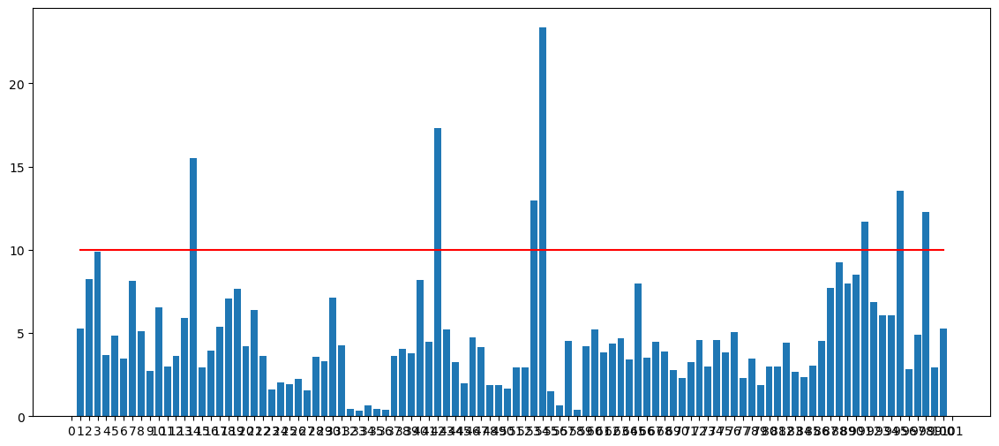

In [25]:
plt.figure(figsize=(14,6))
x_labels = np.arange(0,102)
no_df = pd.DataFrame({'score':smape_list})

plt.bar(np.arange(len(no_df))+1,no_df['score'])
plt.xticks(np.arange(102),x_labels)
plt.plot([1,100], [10, 10], color = 'red')
plt.show()

In [14]:
xgb_params['alpha'] = alpha_list
xgb_params['best_it'] = best_it
xgb_params.head()

,n_estimators,eta,min_child_weight,max_depth,colsample_bytree,subsample,alpha,best_it
0,100,0.01,3,6,0.9,0.9,7,391
1,100,0.01,10,8,0.9,0.9,3,373
2,100,0.01,7,3,0.9,0.9,1,202
3,100,0.01,9,5,0.9,0.9,1,301
4,100,0.01,10,5,0.8,0.9,75,437


In [38]:
merged_test_df.head()


,building_number,temperature,rainfall,windspeed,humidity,hour,day,month,week,day_hour_mean,hour_mean,hour_std,CDH,holiday,sin_time,cos_time,THI,max_power,min_power
0,1,23.5,0.0,2.2,72,0,3,8,34,1627.80,1706.318118,446.882767,-2.5,0,0.000000,1.000000,58.3456,4250.12,1325.32
1,1,23.0,0.0,0.9,72,1,3,8,34,1550.08,1622.620235,439.662704,-5.5,0,0.258819,0.965926,57.4456,4250.12,1325.32
2,1,22.7,0.0,1.5,75,2,3,8,34,1431.12,1506.971294,412.071906,-8.8,0,0.500000,0.866025,57.8725,4250.12,1325.32
3,1,22.1,0.0,1.3,78,3,3,8,34,1372.20,1437.365647,391.205981,-12.7,0,0.707107,0.707107,57.9376,4250.12,1325.32
4,1,21.8,0.0,1.0,77,4,3,8,34,1381.72,1447.321412,381.099697,-16.9,0,0.866025,0.500000,56.9961,4250.12,1325.32


In [39]:
merged_train_df.head()

,building_number,temperature,rainfall,windspeed,humidity,power_consumption,hour,day,month,week,day_hour_mean,hour_mean,hour_std,CDH,holiday,sin_time,cos_time,THI,max_power,min_power
0,1,18.6,0.0,0.9,42.0,1085.28,0,2,6,22,1774.744615,1706.318118,446.882767,-7.4,1,0.000000,1.000000,49.6576,4210.375385,1291.901538
1,1,18.0,0.0,1.1,45.0,1047.36,1,2,6,22,1687.347692,1622.620235,439.662704,-15.4,1,0.258819,0.965926,47.7625,4210.375385,1291.901538
2,1,17.7,0.0,1.5,45.0,974.88,2,2,6,22,1571.483077,1506.971294,412.071906,-23.7,1,0.500000,0.866025,47.2225,4210.375385,1291.901538
3,1,16.7,0.0,1.4,48.0,953.76,3,2,6,22,1522.153846,1437.365647,391.205981,-33.0,1,0.707107,0.707107,44.7856,4210.375385,1291.901538
4,1,18.4,0.0,2.8,43.0,986.40,4,2,6,22,1506.793846,1447.321412,381.099697,-40.6,1,0.866025,0.500000,49.0061,4210.375385,1291.901538


In [15]:
xgb_params.to_csv('./parameters/hyperparameter_xgb_holly4_lbw.csv', index=False)

In [5]:
xgb_params = pd.read_csv('./parameters/hyperparameter_xgb_holly4_lbw.csv')
#best_it = xgb_params['best_it'].to_list()
#best_it[0]        # 1051
xgb_params.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100 entries, 0 to 99
Data columns (total 8 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   n_estimators      100 non-null    int64  
 1   eta               100 non-null    float64
 2   min_child_weight  100 non-null    int64  
 3   max_depth         100 non-null    int64  
 4   colsample_bytree  100 non-null    float64
 5   subsample         100 non-null    float64
 6   alpha             100 non-null    int64  
 7   best_it           100 non-null    int64  
dtypes: float64(3), int64(5)
memory usage: 6.4 KB


## 학습

In [6]:
preds = np.array([])
scores=[]
missfit_building=[]
for i in tqdm(np.arange(1,101,1)):

    pred_df = pd.DataFrame()   # 시드별 예측값을 담을 data frame

    for seed in [0,1,2,3,4,5]: # 각 시드별 예측
        y_train = merged_train_df.loc[merged_train_df.building_number == i, 'power_consumption']
        x_train = merged_train_df.loc[merged_train_df.building_number == i].drop(['power_consumption'], axis=1)
        # y_test = merged_valid_df.loc[merged_valid_df.building_number == i, 'power_consumption']
        # x_test = merged_valid_df.loc[merged_valid_df.building_number == i].drop(['power_consumption'], axis=1)
        y_train, y_test, x_train, x_test = temporal_train_test_split(y = y_train, X = x_train, test_size = 168)

        xgb = XGBRegressor(seed = seed, n_estimators = xgb_params.iloc[i-1, 7], eta = 0.01,
                           min_child_weight = xgb_params.iloc[i-1, 2], max_depth = xgb_params.iloc[i-1, 3],
                           colsample_bytree=xgb_params.iloc[i-1, 4], subsample=xgb_params.iloc[i-1, 5])

        if xgb_params.iloc[i-1,6] != 0:  # 만약 alpha가 0이 아니면 weighted_mse 사용
            xgb.set_params(**{'objective':weighted_mse(xgb_params.iloc[i-1,6])})

        xgb.fit(x_train, y_train)
        y_pred = xgb.predict(x_test)
        pred_df.loc[:,seed] = y_pred   # 각 시드별 예측 담기

    pred = pred_df.mean(axis=1)        # (i+1)번째 건물의 예측 =  (i+1)번째 건물의 각 시드별 예측 평균값
    pred_np = pred.to_numpy()
    y_test_np = y_test.to_numpy()
    score = SMAPE(y_test_np, pred_np)
    
    scores.append(score)
    preds = np.append(preds, pred)

    if score > 6:
        missfit_building.append(i)

100%|██████████| 100/100 [11:00<00:00,  6.61s/it]


In [7]:
np.mean(scores)
miss_score=[]
for i in missfit_building:
    miss_score.append(scores[i-1])

miss_data = pd.DataFrame({'building_number': missfit_building, 'SMAPE': miss_score})


In [21]:
miss_data.to_csv('./miss_data2_lbw.csv', index=False)

In [22]:
all_scores = pd.DataFrame({'building_score': scores})
all_scores.to_csv('./all_scores2_lbw.csv', index=False)

In [6]:
preds = np.array([])
for i in tqdm(np.arange(1,101,1)):

    pred_df = pd.DataFrame()   # 시드별 예측값을 담을 data frame

    for seed in [0,1,2,3,4,5]: # 각 시드별 예측
        y_train = merged_train_df.loc[merged_train_df.building_number == i, 'power_consumption']
        x_train = merged_train_df.loc[merged_train_df.building_number == i].drop(['power_consumption'], axis=1)
        x_test = merged_test_df.loc[merged_test_df.building_number == i]
        
        x_test = x_test[x_train.columns]

        xgb = XGBRegressor(seed = seed, n_estimators = xgb_params.iloc[i-1, 7], eta = 0.01,
                           min_child_weight = xgb_params.iloc[i-1, 2], max_depth = xgb_params.iloc[i-1, 3],
                           colsample_bytree=xgb_params.iloc[i-1, 4], subsample=xgb_params.iloc[i-1, 5])

        if xgb_params.iloc[i-1,6] != 0:  # 만약 alpha가 0이 아니면 weighted_mse 사용
            xgb.set_params(**{'objective':weighted_mse(xgb_params.iloc[i-1,6])})

        xgb.fit(x_train, y_train)
        y_pred = xgb.predict(x_test)
        pred_df.loc[:,seed] = y_pred   # 각 시드별 예측 담기

    pred = pred_df.mean(axis=1)        # (i+1)번째 건물의 예측 =  (i+1)번째 건물의 각 시드별 예측 평균값
    preds = np.append(preds, pred)
    

100%|██████████| 100/100 [08:10<00:00,  4.91s/it]


In [13]:
# preds = np.array([])
# for i in tqdm(np.arange(1,101,1)):

#     pred_df = pd.DataFrame()   # 시드별 예측값을 담을 data frame

#     for seed in [0,1,2,3,4,5]: # 각 시드별 예측
#         y_train = merged_train_df.loc[merged_train_df.building_number == i, 'power_consumption']
#         x_train = merged_train_df.loc[merged_train_df.building_number == i].drop(['power_consumption'], axis=1)
#         x_test = merged_test_df.loc[merged_test_df.building_number == i]
        
#         x_test = x_test[x_train.columns]
#         xgb_params.iloc[94,7]=550
#         xgb = XGBRegressor(seed = seed, n_estimators = xgb_params.iloc[i-1, 7], eta = 0.01,
#                         min_child_weight = xgb_params.iloc[i-1, 2], max_depth = xgb_params.iloc[i-1, 3],
#                         colsample_bytree=xgb_params.iloc[i-1, 4], subsample=xgb_params.iloc[i-1, 5])
    

#         if xgb_params.iloc[i-1,6] != 0:  # 만약 alpha가 0이 아니면 weighted_mse 사용
#             xgb.set_params(**{'objective':weighted_mse(xgb_params.iloc[i-1,6])})

#         xgb.fit(x_train, y_train)
#         y_pred = xgb.predict(x_test)
#         pred_df.loc[:,seed] = y_pred   # 각 시드별 예측 담기

#     pred = pred_df.mean(axis=1)        # (i+1)번째 건물의 예측 =  (i+1)번째 건물의 각 시드별 예측 평균값
#     preds = np.append(preds, pred)
    

100%|██████████| 100/100 [10:27<00:00,  6.28s/it]


## 테스트

In [7]:
preds = pd.Series(preds)

fig, ax = plt.subplots(100, 1, figsize=(100,200), sharex = True)
ax = ax.flatten()
for i in range(100):
    train_y = merged_train_df.loc[merged_train_df.building_number == i+1, 'power_consumption'].reset_index(drop = True)
    test_y = preds[i*168:(i+1)*168]
    ax[i].scatter(np.arange(2040), train_y)
    ax[i].scatter(np.arange(2040, 2040+168) , test_y)
    ax[i].tick_params(axis='both', which='major', labelsize=6)
    ax[i].tick_params(axis='both', which='minor', labelsize=4)
plt.savefig('./predict_xgb_holly4_lbw.png')


## 제출

In [8]:
submission = pd.read_csv('./data/sample_submission.csv')
submission['answer'] = preds
submission.to_csv('./submission/submission_xgb_holly4_lbw.csv', index = False)


## 1등코드 원본


In [ ]:
# from sklearn.model_selection import PredefinedSplit, GridSearchCV
# from sklearn.metrics import make_scorer
# df = pd.DataFrame(columns = ['n_estimators', 'eta', 'min_child_weight','max_depth', 'colsample_bytree', 'subsample'])
# preds = np.array([])

# grid = {'n_estimators' : [100], 'eta' : [0.01], 'min_child_weight' : np.arange(1, 8, 1),
#         'max_depth' : np.arange(3,9,1) , 'colsample_bytree' :np.arange(0.8, 1.0, 0.1),
#         'subsample' :np.arange(0.8, 1.0, 0.1)} # fix the n_estimators & eta(learning rate)

# for i in tqdm(np.arange(1, 101, 1)):
#     y = merged_train_df.loc[merged_train_df.building_number == i, 'power_consumption']
#     x = merged_train_df.loc[merged_train_df.building_number == i, ].drop('power_consumption', axis=1)
#     y_train, y_test, x_train, x_test = temporal_train_test_split(y = y, X = x, test_size = 168)

#     smape_score = make_scorer(SMAPE, graeter_is_better=False)
#     pds = PredefinedSplit(np.append(-np.ones(len(x)-168), np.zeros(168)))
#     gcv = GridSearchCV(estimator = XGBRegressor(seed = 0, gpu_id = 1,
#                                                  tree_method = 'gpu_hist', predictor= 'gpu_predictor'),
#                          param_grid = grid, scoring = smape_score, cv = pds, refit = True, verbose = True)
#     # gcv = GridSearchCV(estimator = XGBRegressor(seed = 0, gpu_id = 1,
#     #                                             tree_method = 'gpu_hist', predictor= 'gpu_predictor'),
#     #                    param_grid = grid, scoring = smape_score, cv = pds, refit = True, verbose = True)


#     gcv.fit(x_train, y_train)
#     best = gcv.best_estimator_
#     params = gcv.best_params_
#     print(params)
#     pred = best.predict(x_test)
#     building = 'building'+str(i)
#     print(building + '|| SMAPE : {}'.format(SMAPE(y_test, pred)))
#     preds = np.append(preds, pred)
#     df = pd.concat([df, pd.DataFrame(params, index = [0])], axis = 0)
#     df.to_csv('./hyperparameter_xgb.csv', index = False) # save the tuned parameters

## 